In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df = pd.read_csv('/content/Hotel Reservations.csv')
df

,Booking_ID,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,INN00001,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled
1,INN00002,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled
2,INN00003,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00,0,Canceled
3,INN00004,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00,0,Canceled
4,INN00005,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50,0,Canceled
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36270,INN36271,3,0,2,6,Meal Plan 1,0,Room_Type 4,85,2018,8,3,Online,0,0,0,167.80,1,Not_Canceled
36271,INN36272,2,0,1,3,Meal Plan 1,0,Room_Type 1,228,2018,10,17,Online,0,0,0,90.95,2,Canceled
36272,INN36273,2,0,2,6,Meal Plan 1,0,Room_Type 1,148,2018,7,1,Online,0,0,0,98.39,2,Not_Canceled
36273,INN36274,2,0,0,3,Not Selected,0,Room_Type 1,63,2018,4,21,Online,0,0,0,94.50,0,Canceled


**COLUMN DESCRIPTION**
*   Booking_ID: unique identifier of each booking
*   no_of_adults: Number of adults
*   no_of_children: Number of Children
*   no_of_weekend_nights: Number of weekend nights (Saturday or Sunday) the guest stayed or booked to stay at the hotel
*   type_of_meal_plan: Type of meal plan booked by the customer
*   required_car_parking_space: Does the customer require a car parking space? (0 - No, 1- Yes)
*   room_type_reserved: Type of room reserved by the customer. The values are ciphered (encoded) by INN Hotels.
*   lead_time: Number of days between the date of booking and the arrival date
*   arrival_year: Year of arrival date
*   arrival_month: Month of arrival date
*   arrival_date: Date of the month
*   market_segment_type: Market segment designation.
*   repeated_guest: Is the customer a repeated guest? (0 - No, 1- Yes)
*   no_of_previous_cancellations: Number of previous bookings that were canceled by the customer prior to the current booking
*   no_of_previous_bookings_not_canceled: Number of previous bookings not canceled by the customer prior to the current booking
*   avg_price_per_room: Average price per day of the reservation; prices of the rooms are dynamic. (in euros)
*   no_of_special_requests: Total number of special requests made by the customer (e.g. high floor, view from the room, etc)
*   booking_status: Flag indicating if the booking was canceled or not.


# EDA

<Axes: >

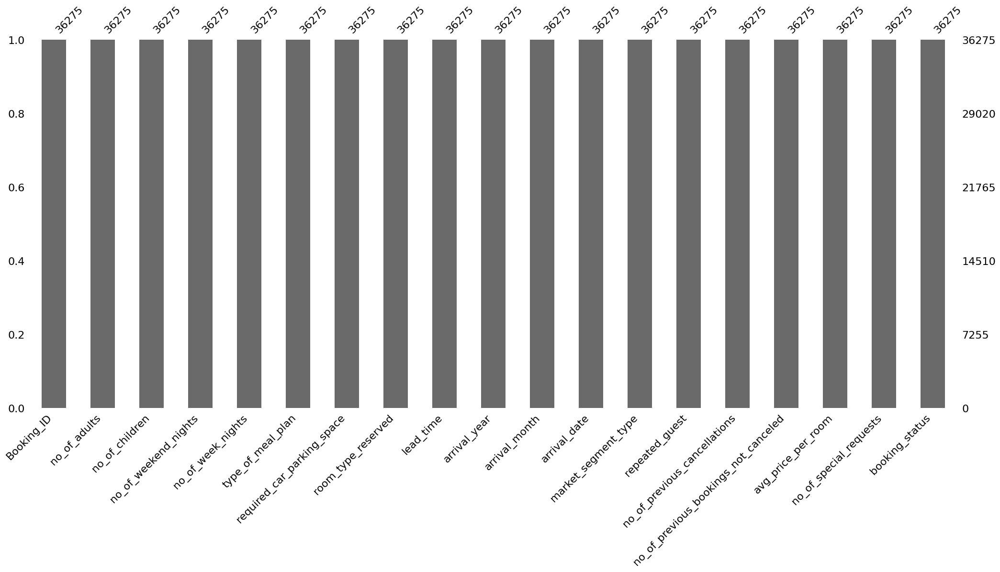

In [ ]:
import missingno as msno
msno.bar(df)

In [ ]:
df.isnull().sum()

Booking_ID                              0
no_of_adults                            0
no_of_children                          0
no_of_weekend_nights                    0
no_of_week_nights                       0
type_of_meal_plan                       0
required_car_parking_space              0
room_type_reserved                      0
lead_time                               0
arrival_year                            0
arrival_month                           0
arrival_date                            0
market_segment_type                     0
repeated_guest                          0
no_of_previous_cancellations            0
no_of_previous_bookings_not_canceled    0
avg_price_per_room                      0
no_of_special_requests                  0
booking_status                          0
dtype: int64

In [ ]:
df.describe()

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,required_car_parking_space,lead_time,arrival_year,arrival_month,arrival_date,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests
count,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000,36275.000000
mean,1.844962,0.105279,0.810724,2.204300,0.030986,85.232557,2017.820427,7.423653,15.596995,0.025637,0.023349,0.153411,103.423539,0.619655
std,0.518715,0.402648,0.870644,1.410905,0.173281,85.930817,0.383836,3.069894,8.740447,0.158053,0.368331,1.754171,35.089424,0.786236
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2017.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2.000000,0.000000,0.000000,1.000000,0.000000,17.000000,2018.000000,5.000000,8.000000,0.000000,0.000000,0.000000,80.300000,0.000000
50%,2.000000,0.000000,1.000000,2.000000,0.000000,57.000000,2018.000000,8.000000,16.000000,0.000000,0.000000,0.000000,99.450000,0.000000
75%,2.000000,0.000000,2.000000,3.000000,0.000000,126.000000,2018.000000,10.000000,23.000000,0.000000,0.000000,0.000000,120.000000,1.000000
max,4.000000,10.000000,7.000000,17.000000,1.000000,443.000000,2018.000000,12.000000,31.000000,1.000000,13.000000,58.000000,540.000000,5.000000


In [ ]:
df.drop(columns = ['Booking_ID'], axis = 1, inplace = True)
df

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,2,0,1,2,Meal Plan 1,0,Room_Type 1,224,2017,10,2,Offline,0,0,0,65.00,0,Not_Canceled
1,2,0,2,3,Not Selected,0,Room_Type 1,5,2018,11,6,Online,0,0,0,106.68,1,Not_Canceled
2,1,0,2,1,Meal Plan 1,0,Room_Type 1,1,2018,2,28,Online,0,0,0,60.00,0,Canceled
3,2,0,0,2,Meal Plan 1,0,Room_Type 1,211,2018,5,20,Online,0,0,0,100.00,0,Canceled
4,2,0,1,1,Not Selected,0,Room_Type 1,48,2018,4,11,Online,0,0,0,94.50,0,Canceled
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36270,3,0,2,6,Meal Plan 1,0,Room_Type 4,85,2018,8,3,Online,0,0,0,167.80,1,Not_Canceled
36271,2,0,1,3,Meal Plan 1,0,Room_Type 1,228,2018,10,17,Online,0,0,0,90.95,2,Canceled
36272,2,0,2,6,Meal Plan 1,0,Room_Type 1,148,2018,7,1,Online,0,0,0,98.39,2,Not_Canceled
36273,2,0,0,3,Not Selected,0,Room_Type 1,63,2018,4,21,Online,0,0,0,94.50,0,Canceled


In [ ]:
def classifier_column(df: pd.DataFrame, threshold: int = 10) -> list[str]:
  discrete_columns = []

  for column in df.columns:
    if df[column].nunique() <= threshold:
      discrete_columns.append(column)

  continuous_columns = [col for col in df.columns.tolist() if col not in discrete_columns]

  return discrete_columns, continuous_columns

In [ ]:
discrete_columns, continuous_columns = classifier_column(df)

In [ ]:
discrete_columns, continuous_columns

(['no_of_adults',
  'no_of_children',
  'no_of_weekend_nights',
  'type_of_meal_plan',
  'required_car_parking_space',
  'room_type_reserved',
  'arrival_year',
  'market_segment_type',
  'repeated_guest',
  'no_of_previous_cancellations',
  'no_of_special_requests',
  'booking_status'],
 ['no_of_week_nights',
  'lead_time',
  'arrival_month',
  'arrival_date',
  'no_of_previous_bookings_not_canceled',
  'avg_price_per_room'])

In [ ]:
TARGET = "booking_status"

In [ ]:
def visualize_discrete(df: pd.DataFrame):
    fig, axes = plt.subplots(nrows=len(discrete_columns), ncols=2, figsize=(12, 6 * len(discrete_columns)))
    fig.subplots_adjust(hspace=0.25)
    sns.color_palette("Blues", as_cmap=True)

    for index, column in enumerate(discrete_columns):
        # Plot countplot
        sns.countplot(data=df, x=column, ax=axes[index, 0], palette="blend:#7AB,#EDA")
        axes[index, 0].set_title(f"Countplot of {column}")
        axes[index, 0].set_xlabel("")

        # Plot countplot
        sns.countplot(data=df, x=column, hue=TARGET, ax=axes[index, 1], palette="blend:#7AB,#EDA")
        axes[index, 1].set_title(f"Countplot of {column} specified by {TARGET}")
        axes[index, 1].set_xlabel("")

    # Show the plot
    plt.show()

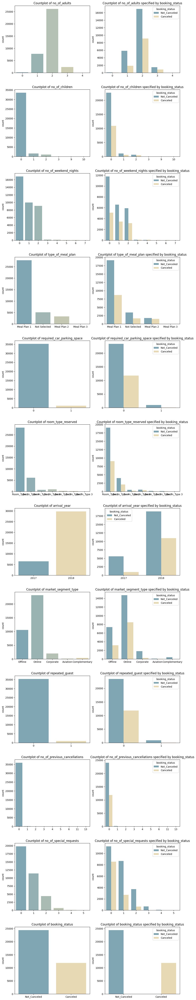

In [ ]:
visualize_discrete(df)

In [ ]:
def visualize_continuous(df: pd.DataFrame, target: str):
    # Set the figure size and layout
    fig, axes = plt.subplots(nrows=len(continuous_columns), ncols=2, figsize=(12, 6 * len(continuous_columns)))
    fig.tight_layout(pad=2.0)

    for index, column in enumerate(continuous_columns):
        # Plot boxplot
        sns.boxplot(data=df, x=TARGET, y=column, ax=axes[index, 0], palette="blend:#7AB,#EDA")
        axes[index, 0].set_title(f"Boxplot of {column}")
        axes[index, 0].set_xlabel("")

        # Plot distribution
        sns.histplot(data=df, x=column, kde=True, ax=axes[index, 1], palette="blend:#7AB,#EDA")
        axes[index, 1].set_title(f"Distribution of {column}")
        axes[index, 1].set_xlabel("")

    # Show the plot
    plt.show()

<ipython-input-13-d3d384e7f385>:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x=column, kde=True, ax=axes[index, 1], palette="blend:#7AB,#EDA")
<ipython-input-13-d3d384e7f385>:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x=column, kde=True, ax=axes[index, 1], palette="blend:#7AB,#EDA")
<ipython-input-13-d3d384e7f385>:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x=column, kde=True, ax=axes[index, 1], palette="blend:#7AB,#EDA")
<ipython-input-13-d3d384e7f385>:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x=column, kde=True, ax=axes[index, 1], palette="blend:#7AB,#EDA")
<ipython-input-13-d3d384e7f385>:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x=column, kde=True, ax=axes[index, 1], palette="ble

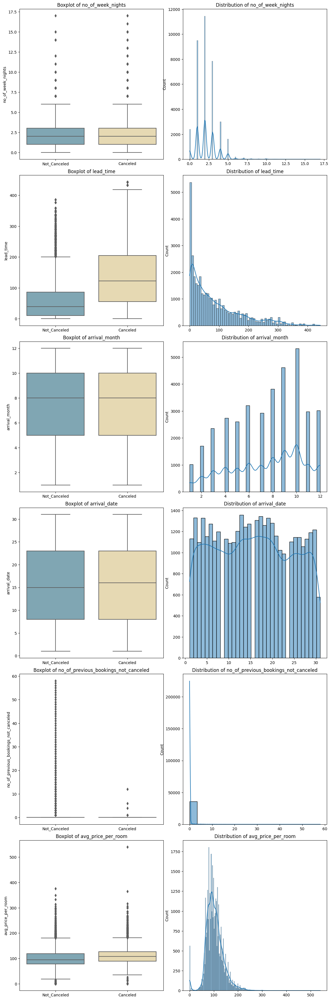

In [ ]:
visualize_continuous(df, target=TARGET)

In [ ]:
def replace_outliers(df: pd.DataFrame, inner_fence_multiplier: float = 1.5, outer_fence_multiplier: float = 3.0) -> pd.DataFrame:

    for column in continuous_columns:
        # Calculate the Interquartile Range (IQR)
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1

        # Calculate the inner and outer fences
        inner_fence_low = Q1 - inner_fence_multiplier * IQR
        inner_fence_high = Q3 + inner_fence_multiplier * IQR
        outer_fence_low = Q1 - outer_fence_multiplier * IQR
        outer_fence_high = Q3 + outer_fence_multiplier * IQR

        # Identify the outliers using the inner and outer fences
        outliers = (df[column] < inner_fence_low) | (df[column] > inner_fence_high) | \
                   (df[column] < outer_fence_low) | (df[column] > outer_fence_high)

        # Replace the outliers with the mean value
        df.loc[outliers, column] = df[column].mean()


    return df

In [ ]:
df = replace_outliers(df)
df

,no_of_adults,no_of_children,no_of_weekend_nights,no_of_week_nights,type_of_meal_plan,required_car_parking_space,room_type_reserved,lead_time,arrival_year,arrival_month,arrival_date,market_segment_type,repeated_guest,no_of_previous_cancellations,no_of_previous_bookings_not_canceled,avg_price_per_room,no_of_special_requests,booking_status
0,2,0,1,2.0,Meal Plan 1,0,Room_Type 1,224.0,2017,10.0,2.0,Offline,0,0,0.0,65.00,0,Not_Canceled
1,2,0,2,3.0,Not Selected,0,Room_Type 1,5.0,2018,11.0,6.0,Online,0,0,0.0,106.68,1,Not_Canceled
2,1,0,2,1.0,Meal Plan 1,0,Room_Type 1,1.0,2018,2.0,28.0,Online,0,0,0.0,60.00,0,Canceled
3,2,0,0,2.0,Meal Plan 1,0,Room_Type 1,211.0,2018,5.0,20.0,Online,0,0,0.0,100.00,0,Canceled
4,2,0,1,1.0,Not Selected,0,Room_Type 1,48.0,2018,4.0,11.0,Online,0,0,0.0,94.50,0,Canceled
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36270,3,0,2,6.0,Meal Plan 1,0,Room_Type 4,85.0,2018,8.0,3.0,Online,0,0,0.0,167.80,1,Not_Canceled
36271,2,0,1,3.0,Meal Plan 1,0,Room_Type 1,228.0,2018,10.0,17.0,Online,0,0,0.0,90.95,2,Canceled
36272,2,0,2,6.0,Meal Plan 1,0,Room_Type 1,148.0,2018,7.0,1.0,Online,0,0,0.0,98.39,2,Not_Canceled
36273,2,0,0,3.0,Not Selected,0,Room_Type 1,63.0,2018,4.0,21.0,Online,0,0,0.0,94.50,0,Canceled


<ipython-input-13-d3d384e7f385>:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x=column, kde=True, ax=axes[index, 1], palette="blend:#7AB,#EDA")
<ipython-input-13-d3d384e7f385>:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x=column, kde=True, ax=axes[index, 1], palette="blend:#7AB,#EDA")
<ipython-input-13-d3d384e7f385>:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x=column, kde=True, ax=axes[index, 1], palette="blend:#7AB,#EDA")
<ipython-input-13-d3d384e7f385>:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x=column, kde=True, ax=axes[index, 1], palette="blend:#7AB,#EDA")
<ipython-input-13-d3d384e7f385>:13: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.histplot(data=df, x=column, kde=True, ax=axes[index, 1], palette="ble

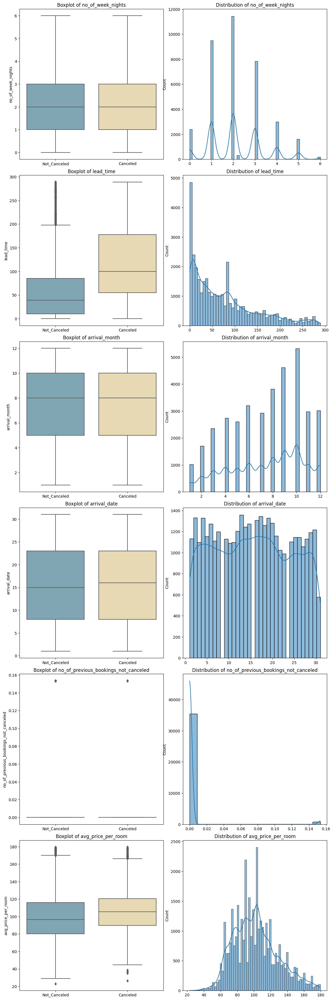

In [ ]:
visualize_continuous(df, target=TARGET)

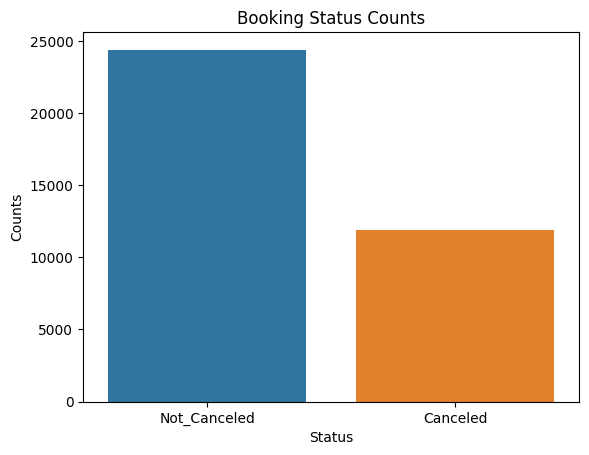

In [ ]:
#sns.countplot(x = 'booking_status', data = df)
#plt.xlabel('Status', fontsize = 10)
#plt.ylabel('Counts', fontsize = 10)
#plt.title('Booking Status Counts')
#plt.show()

In [ ]:
#sns.catplot(data = df, x= 'booking_status', kind = 'count', height = 8)

Canceled rate is 32.76361130254997 %

In [ ]:
#print('Canceled rate is', len(df[df['booking_status'] == 'Canceled'])*100/len(df), '%')

Canceled rate is 32.76361130254997 %


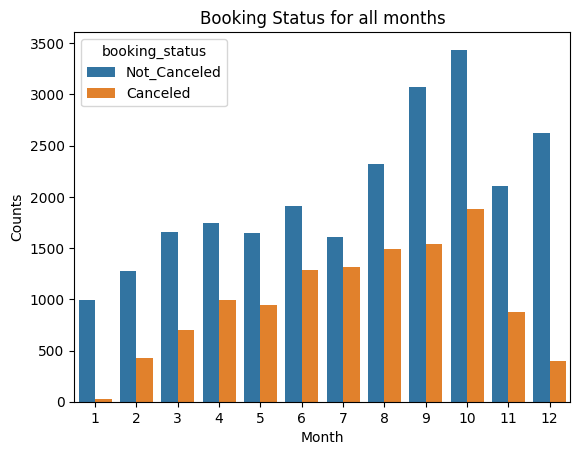

In [ ]:
#sns.countplot(x= 'arrival_month', hue = 'booking_status', data = df)
#plt.xlabel('Month', fontsize = 10)
#plt.ylabel('Counts', fontsize = 10)
#plt.title('Booking Status for all months')
#plt.show()

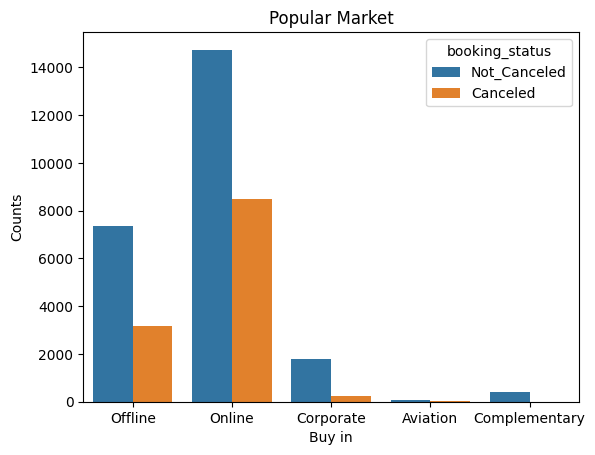

In [ ]:
#sns.countplot(x = 'market_segment_type', hue = 'booking_status', data =df)
#plt.xlabel('Buy in', fontsize = 10)
#plt.ylabel('Counts', fontsize = 10)
#plt .title('Popular Market')
#plt.show()

Compare Income: 2017 vs 2018

In [ ]:
income_price = df.groupby('arrival_year')['avg_price_per_room'].mean()
income_price.head()

arrival_year
2017     92.312490
2018    104.310229
Name: avg_price_per_room, dtype: float64

In [ ]:
mean_value = np.mean(income_price.values)

In [ ]:
#create new feature
df['total_guest'] = df['no_of_adults'] + df['no_of_children']
df['total_night'] = df['no_of_weekend_nights'] + df['no_of_week_nights']
df['date'] = pd.to_datetime(dict(year = df.arrival_year, month = df.arrival_month, day = df.arrival_date), errors = 'coerce')
df['total_booking'] = df['no_of_previous_cancellations'] + df['no_of_previous_bookings_not_canceled']
df['previous_booking_rate'] = np.where(df['total_booking'] < 1, df['total_booking'], df['no_of_previous_bookings_not_canceled']*100/df['total_booking'])

<ipython-input-21-aa4f4450a243>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr())


<Axes: >

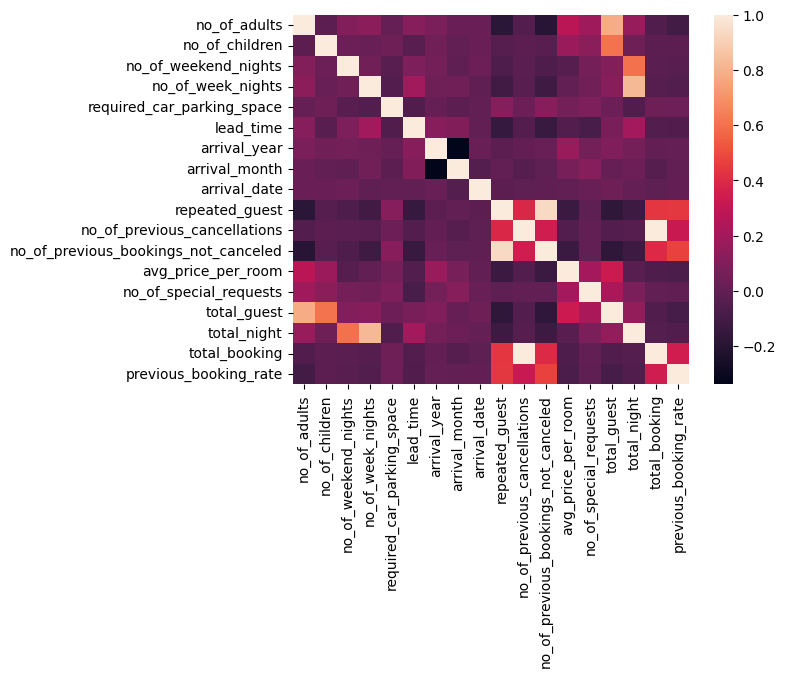

In [ ]:
sns.heatmap(df.corr())

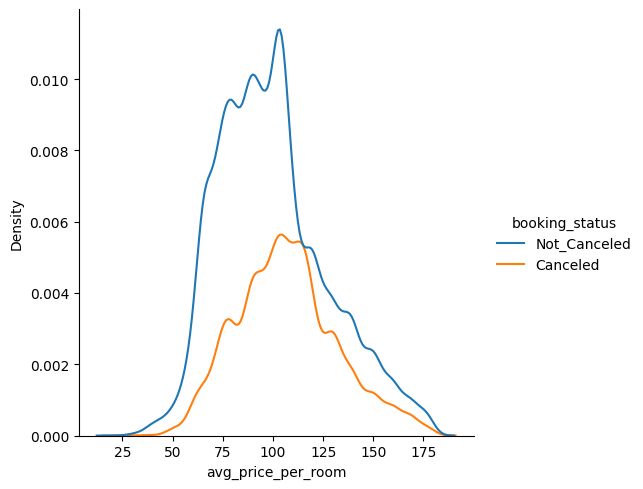

In [ ]:
sns.displot(data = df, x= 'avg_price_per_room', hue = 'booking_status', kind= 'kde')

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'Room_Type 1'),
  Text(1, 0, 'Room_Type 4'),
  Text(2, 0, 'Room_Type 2'),
  Text(3, 0, 'Room_Type 6'),
  Text(4, 0, 'Room_Type 5'),
  Text(5, 0, 'Room_Type 7'),
  Text(6, 0, 'Room_Type 3')])

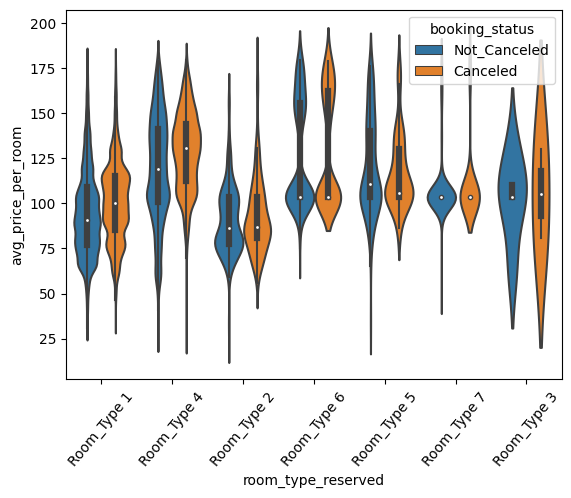

In [ ]:
sns.violinplot(data = df, x = 'room_type_reserved', y = 'avg_price_per_room', hue = 'booking_status')
plt.xticks(rotation = 50)

<Axes: xlabel='arrival_year', ylabel='count'>

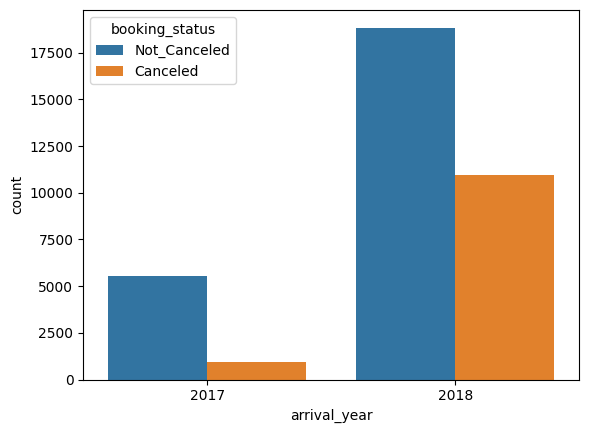

In [ ]:
sns.countplot(data =df, x = 'arrival_year', hue = 'booking_status')

# DATA PREPROCESSING

In [ ]:
#feature used for prediction:

feature_cat = ['market_segment_type']
feature_label = ['required_car_parking_space', 'repeated_guest']
feature_num = ['total_guest', 'total_night', 'lead_time', 'no_of_special_requests', 'avg_price_per_room']

In [ ]:
df_dp = df[feature_cat + feature_label + feature_num + ['booking_status']]
df_dp

,market_segment_type,required_car_parking_space,repeated_guest,total_guest,total_night,lead_time,no_of_special_requests,avg_price_per_room,booking_status
0,Offline,0,0,2,3.0,224.0,0,65.00,Not_Canceled
1,Online,0,0,2,5.0,5.0,1,106.68,Not_Canceled
2,Online,0,0,1,3.0,1.0,0,60.00,Canceled
3,Online,0,0,2,2.0,211.0,0,100.00,Canceled
4,Online,0,0,2,2.0,48.0,0,94.50,Canceled
...,...,...,...,...,...,...,...,...,...
36270,Online,0,0,3,8.0,85.0,1,167.80,Not_Canceled
36271,Online,0,0,2,4.0,228.0,2,90.95,Canceled
36272,Online,0,0,2,8.0,148.0,2,98.39,Not_Canceled
36273,Online,0,0,2,3.0,63.0,0,94.50,Canceled


In [ ]:
#Changing the encode type:

df_encoded = pd.get_dummies(df_dp, columns = feature_cat)
df_encoded

,required_car_parking_space,repeated_guest,total_guest,total_night,lead_time,no_of_special_requests,avg_price_per_room,booking_status,market_segment_type_Aviation,market_segment_type_Complementary,market_segment_type_Corporate,market_segment_type_Offline,market_segment_type_Online
0,0,0,2,3.0,224.0,0,65.00,Not_Canceled,0,0,0,1,0
1,0,0,2,5.0,5.0,1,106.68,Not_Canceled,0,0,0,0,1
2,0,0,1,3.0,1.0,0,60.00,Canceled,0,0,0,0,1
3,0,0,2,2.0,211.0,0,100.00,Canceled,0,0,0,0,1
4,0,0,2,2.0,48.0,0,94.50,Canceled,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
36270,0,0,3,8.0,85.0,1,167.80,Not_Canceled,0,0,0,0,1
36271,0,0,2,4.0,228.0,2,90.95,Canceled,0,0,0,0,1
36272,0,0,2,8.0,148.0,2,98.39,Not_Canceled,0,0,0,0,1
36273,0,0,2,3.0,63.0,0,94.50,Canceled,0,0,0,0,1


In [ ]:
from sklearn import preprocessing

le = preprocessing.LabelEncoder
X = df_encoded.drop('booking_status', axis = 1)

In [ ]:
df_encoded['booking_status'] = le.fit_transform(X, df_encoded['booking_status'])
df_encoded['booking_status']

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:117: UserWarning: Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access
  self.classes_, y = _unique(y, return_inverse=True)


0        1
1        1
2        0
3        0
4        0
        ..
36270    1
36271    0
36272    1
36273    0
36274    1
Name: booking_status, Length: 36275, dtype: int64

In [ ]:
y = df_encoded['booking_status']

In [ ]:
y

0        1
1        1
2        0
3        0
4        0
        ..
36270    1
36271    0
36272    1
36273    0
36274    1
Name: booking_status, Length: 36275, dtype: int64

In [ ]:
from imblearn.under_sampling import RandomUnderSampler, NearMiss
rus = RandomUnderSampler(random_state = 42)

# CREATE MODEL

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC

In [ ]:
sc = StandardScaler()
dc = DecisionTreeClassifier(random_state = 24)
rf= RandomForestClassifier(random_state=24)
knn = KNeighborsClassifier()
svm = SVC(random_state = 24, probability=True)
lr = LogisticRegression(max_iter = 1000, random_state = 24)

In [ ]:
models = [dc, rf, knn, lr]

# TRAIN TEST SPLIT

In [ ]:
from sklearn.model_selection import train_test_split

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_recall_curve

In [ ]:
X_train_test_split = X.copy()
y_train_test_split = y.copy()

In [ ]:
X_train_test_split, y_train_test_split = rus.fit_resample(X_train_test_split, y_train_test_split)

X_train, X_test, y_train, y_test = train_test_split(X_train_test_split, y_train_test_split, test_size = 0.2, random_state = 24)

In [ ]:
X_train[feature_num] = sc.fit_transform(X_train[feature_num])

X_test[feature_num] = sc.transform(X_test[feature_num])

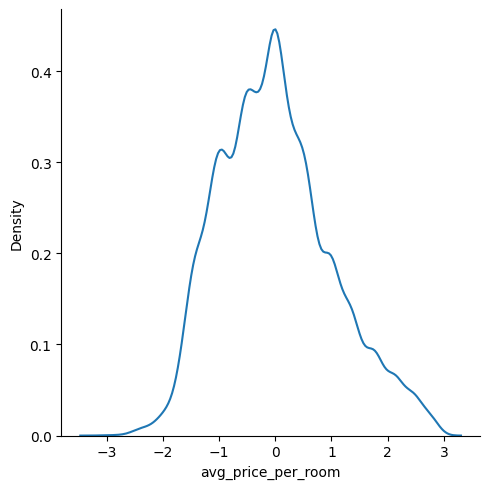

In [ ]:
sns.displot(X_train, x = 'avg_price_per_room', kind = 'kde')

In [ ]:
train_data = pd.concat([X_train, y_train], axis = 1)

In [ ]:
train_data

,required_car_parking_space,repeated_guest,total_guest,total_night,lead_time,no_of_special_requests,avg_price_per_room,market_segment_type_Aviation,market_segment_type_Complementary,market_segment_type_Corporate,market_segment_type_Offline,market_segment_type_Online,booking_status
14619,0,0,0.046721,-0.642826,-0.001136,-0.730636,0.060682,0,0,0,1,0,1
6614,0,0,0.046721,-0.004329,1.068817,-0.730636,1.009038,0,0,0,1,0,0
16336,0,0,0.046721,-0.642826,-0.897223,-0.730636,-0.128989,0,0,1,0,0,1
274,0,0,1.583828,-0.004329,0.507092,0.618143,1.505976,0,0,0,0,1,0
16093,0,0,1.583828,-0.642826,-0.950721,1.966921,1.843591,0,0,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
21633,0,0,0.046721,-1.281324,-1.057716,0.618143,-0.876294,0,0,0,0,1,1
19857,0,1,-1.490385,-0.642826,-0.883848,-0.730636,-0.735937,0,0,1,0,0,1
14528,0,0,0.046721,-0.004329,0.079110,-0.730636,-1.181664,0,0,0,0,1,1
899,0,0,-1.490385,-0.642826,-1.137963,-0.730636,-1.456688,0,0,1,0,0,0


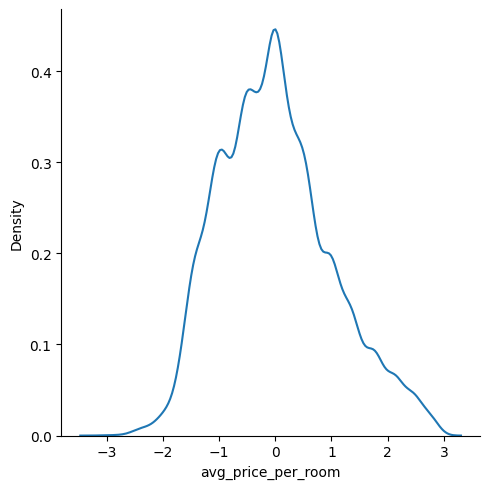

In [ ]:
sns.displot(train_data, x = 'avg_price_per_room', kind = 'kde')

In [ ]:
all_col = list(train_data)
all_col

['required_car_parking_space',
 'repeated_guest',
 'total_guest',
 'total_night',
 'lead_time',
 'no_of_special_requests',
 'avg_price_per_room',
 'market_segment_type_Aviation',
 'market_segment_type_Complementary',
 'market_segment_type_Corporate',
 'market_segment_type_Offline',
 'market_segment_type_Online',
 'booking_status']

In [ ]:
all_col.pop()
all_col

['required_car_parking_space',
 'repeated_guest',
 'total_guest',
 'total_night',
 'lead_time',
 'no_of_special_requests',
 'avg_price_per_room',
 'market_segment_type_Aviation',
 'market_segment_type_Complementary',
 'market_segment_type_Corporate',
 'market_segment_type_Offline',
 'market_segment_type_Online']

In [ ]:
X_train = train_data[all_col]
y_train = train_data['booking_status']

In [ ]:
!pip install graphviz

In [ ]:
X_train

,required_car_parking_space,repeated_guest,total_guest,total_night,lead_time,no_of_special_requests,avg_price_per_room,market_segment_type_Aviation,market_segment_type_Complementary,market_segment_type_Corporate,market_segment_type_Offline,market_segment_type_Online
14619,0,0,0.046721,-0.642826,-0.001136,-0.730636,0.060682,0,0,0,1,0
6614,0,0,0.046721,-0.004329,1.068817,-0.730636,1.009038,0,0,0,1,0
16336,0,0,0.046721,-0.642826,-0.897223,-0.730636,-0.128989,0,0,1,0,0
274,0,0,1.583828,-0.004329,0.507092,0.618143,1.505976,0,0,0,0,1
16093,0,0,1.583828,-0.642826,-0.950721,1.966921,1.843591,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...
21633,0,0,0.046721,-1.281324,-1.057716,0.618143,-0.876294,0,0,0,0,1
19857,0,1,-1.490385,-0.642826,-0.883848,-0.730636,-0.735937,0,0,1,0,0
14528,0,0,0.046721,-0.004329,0.079110,-0.730636,-1.181664,0,0,0,0,1
899,0,0,-1.490385,-0.642826,-1.137963,-0.730636,-1.456688,0,0,1,0,0


In [ ]:
def cal_model(Xtrain, Xtest, ytrain, ytest, model):

  model.fit(Xtrain, ytrain)
  y_pred = model.predict(Xtest)
  print('Model: ', type(model).__name__)
  print('Accuracy: ', accuracy_score(ytest, y_pred))
  print('Precision: ', precision_score(ytest, y_pred))
  print('Recall: ',recall_score(ytest, y_pred))
  print('F1 Score:', f1_score(ytest, y_pred))

  plt.figure(figsize = (4, 2))
  cm = confusion_matrix(y_pred, ytest)
  sns.heatmap(cm, annot = True, fmt = '.6g')
  plt.title('Confusion Matrix')
  plt.xlabel('Actual')
  plt.ylabel('Prediction')
  plt.show()


Model:  DecisionTreeClassifier
Accuracy:  0.8186790071518721
Precision:  0.823073611708997
Recall:  0.8091409225560728
F1 Score: 0.8160478019632948


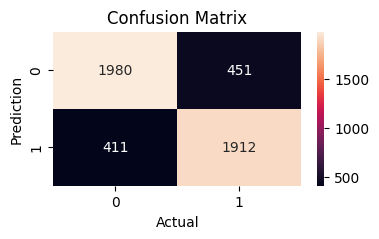

In [ ]:
cal_model(X_train, X_test, y_train, y_test, dc)

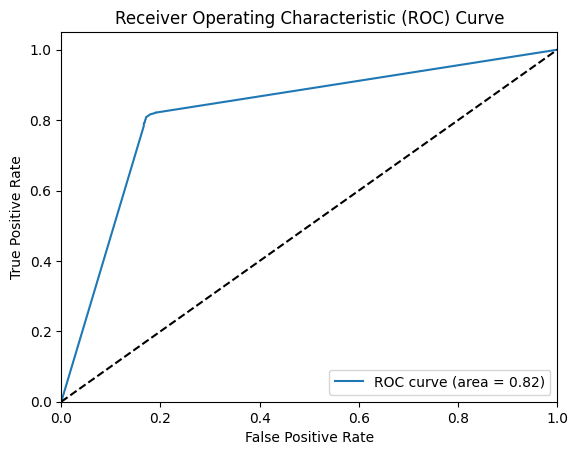

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Create a Logistic Regression model object and fit it to the training data
dc.fit(X_train, y_train)

# Predict the probabilities of the testing data using the trained model
y_prob = dc.predict_proba(X_test)[:, 1]

# Compute the false positive rate and true positive rate for various threshold settings
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# Compute the area under the ROC curve
auc_score = auc(fpr, tpr)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

In [ ]:
from sklearn.tree import export_graphviz
from graphviz import Source
from sklearn.tree import DecisionTreeClassifier, export_graphviz
import graphviz

dc.fit(X_train, y_train)
dot_data = export_graphviz(dc, out_file=None,
                           feature_names=X_train.columns.values,
                           class_names=y_train.astype(str).unique(),
                           filled=True, rounded=True,
                           special_characters=True)

graph = graphviz.Source(dot_data)
graph.render("decision_tree")

# Display graph
graph

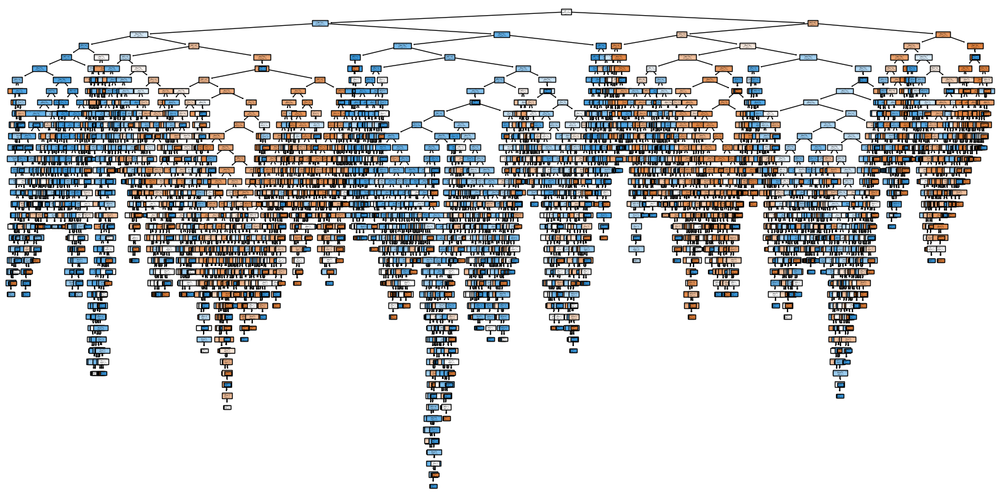

In [ ]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

plt.figure(figsize=(20,10)) # set the figure size
plot_tree(dc, filled=True, feature_names=X.columns, class_names=['0', '1'])
plt.show()

Model:  LogisticRegression
Accuracy:  0.7410601598653765
Precision:  0.7366220735785953
Recall:  0.7456622936944562
F1 Score: 0.7411146161934805


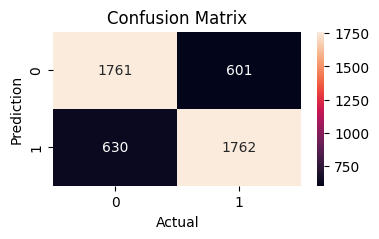

In [ ]:
cal_model(X_train, X_test, y_train, y_test, lr)

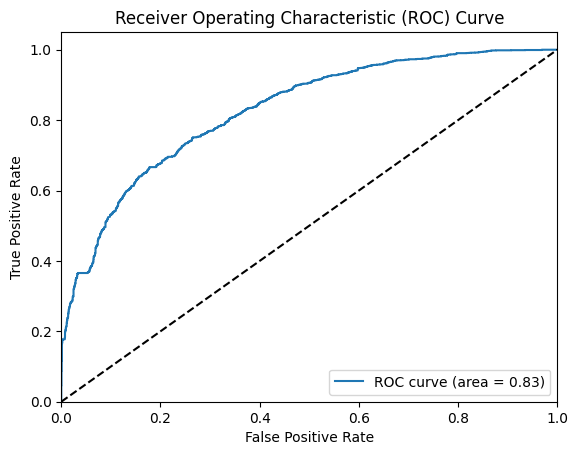

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Create a Logistic Regression model object and fit it to the training data
lr.fit(X_train, y_train)

# Predict the probabilities of the testing data using the trained model
y_prob = lr.predict_proba(X_test)[:, 1]

# Compute the false positive rate and true positive rate for various threshold settings
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# Compute the area under the ROC curve
auc_score = auc(fpr, tpr)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

Model:  RandomForestClassifier
Accuracy:  0.855490113588557
Precision:  0.8578138343296328
Recall:  0.8501904358865848
F1 Score: 0.8539851222104143


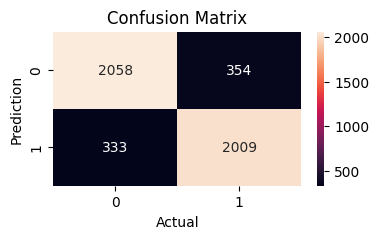

In [ ]:
cal_model(X_train, X_test, y_train, y_test, rf)

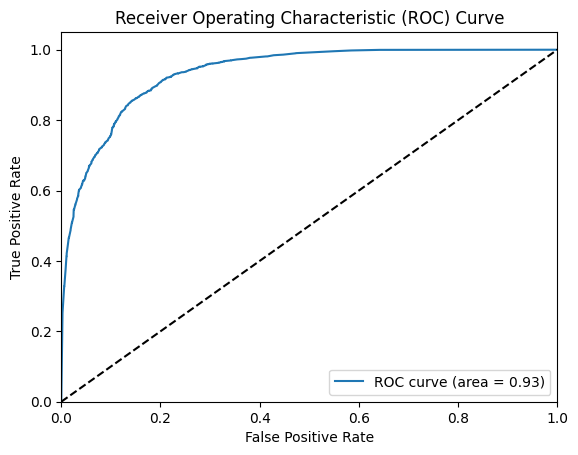

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Create a Logistic Regression model object and fit it to the training data
rf.fit(X_train, y_train)

# Predict the probabilities of the testing data using the trained model
y_prob = rf.predict_proba(X_test)[:, 1]

# Compute the false positive rate and true positive rate for various threshold settings
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# Compute the area under the ROC curve
auc_score = auc(fpr, tpr)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

Model:  KNeighborsClassifier
Accuracy:  0.8228859907446361
Precision:  0.8237547892720306
Recall:  0.818874312314854
F1 Score: 0.8213073005093379


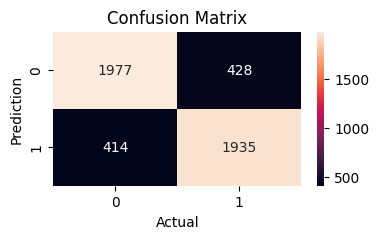

In [ ]:
cal_model(X_train, X_test, y_train, y_test, knn)

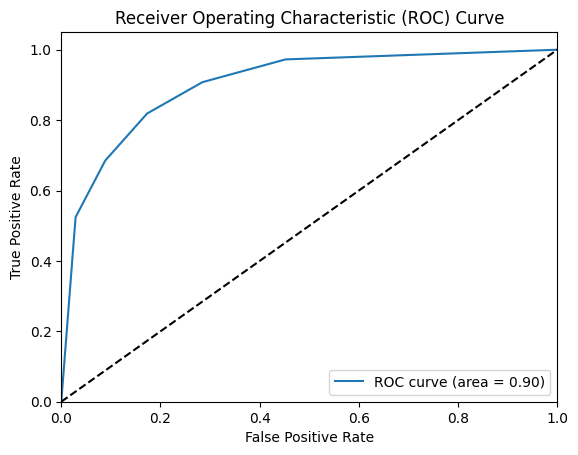

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Create a Logistic Regression model object and fit it to the training data
knn.fit(X_train, y_train)

# Predict the probabilities of the testing data using the trained model
y_prob = knn.predict_proba(X_test)[:, 1]

# Compute the false positive rate and true positive rate for various threshold settings
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# Compute the area under the ROC curve
auc_score = auc(fpr, tpr)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

Model:  SVC
Accuracy:  0.7919646613378207
Precision:  0.7799511002444988
Recall:  0.8099873042742277
F1 Score: 0.7946854888935022


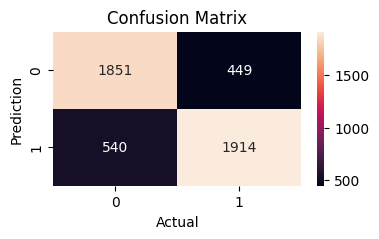

In [ ]:
cal_model(X_train, X_test, y_train, y_test, svm)

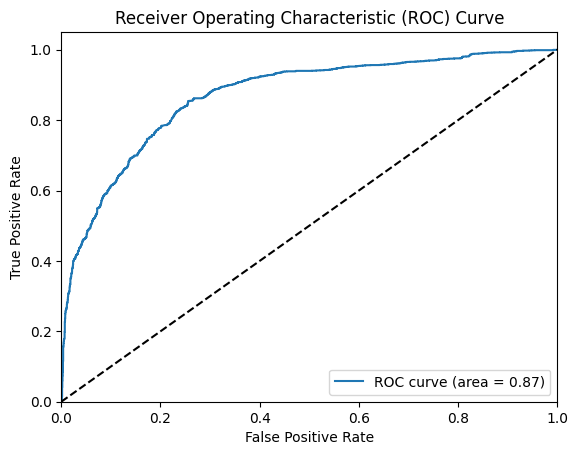

In [ ]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# Create a Logistic Regression model object and fit it to the training data
svm.fit(X_train, y_train)

# Predict the probabilities of the testing data using the trained model
y_prob = svm.predict_proba(X_test)[:, 1]

# Compute the false positive rate and true positive rate for various threshold settings
fpr, tpr, thresholds = roc_curve(y_test, y_prob)

# Compute the area under the ROC curve
auc_score = auc(fpr, tpr)

# Plot the ROC curve
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % auc_score)
plt.plot([0, 1], [0, 1], 'k--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()